In [1]:
# pip install pandas numpy matplotlib seaborn scikit-learn plotly yellowbrick xgboost nbformat 
# (Optional) lightgbm is required for the LightGBM section.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, RandomForestRegressor, BaggingClassifier, StackingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report ,mean_absolute_error, mean_squared_error, r2_score
import lightgbm as lgb
import math
import warnings
warnings.filterwarnings('ignore')


<h2>Loading the Dataset</h2>

In [3]:
DATA_PATH = 'data/heart_attack_prediction_dataset.csv'
df = pd.read_csv(DATA_PATH)

# Standardize target column name used throughout the notebook
if 'target' not in df.columns and 'Heart Attack Risk' in df.columns:
    df = df.rename(columns={'Heart Attack Risk': 'target'})

# Normalize column names (snake_case) to avoid KeyError issues in later cells
df = df.rename(columns={
    'Patient ID': 'patient_id',
    'Age': 'age',
    'Sex': 'sex',
    'Cholesterol': 'cholesterol',
    'Blood Pressure': 'blood_pressure',
    'Heart Rate': 'heart_rate',
    'Diabetes': 'diabetes',
    'Family History': 'family_history',
    'Smoking': 'smoking',
    'Obesity': 'obesity',
    'Alcohol Consumption': 'alcohol_consumption',
    'Exercise Hours Per Week': 'exercise_hours_per_week',
    'Diet': 'diet',
    'Previous Heart Problems': 'previous_heart_problems',
    'Medication Use': 'medication_use',
    'Stress Level': 'stress_level',
    'Sedentary Hours Per Day': 'sedentary_hours_per_day',
    'Income': 'income',
    'BMI': 'bmi',
    'Triglycerides': 'triglycerides',
    'Physical Activity Days Per Week': 'physical_activity_days_per_week',
    'Sleep Hours Per Day': 'sleep_hours_per_day',
    'Country': 'country',
    'Continent': 'continent',
    'Hemisphere': 'hemisphere',
})

# Parse blood pressure into numeric features and drop the raw string column
if 'blood_pressure' in df.columns:
    bp_parts = df['blood_pressure'].astype(str).str.split('/', n=1, expand=True)
    df['systolic_bp'] = pd.to_numeric(bp_parts[0], errors='coerce')
    df['diastolic_bp'] = pd.to_numeric(bp_parts[1], errors='coerce')
    df = df.drop(columns=['blood_pressure'])

# Drop high-cardinality identifier
df = df.drop(columns=['patient_id'], errors='ignore')

# Optional: encode sex as numeric if it's string
if 'sex' in df.columns and df['sex'].dtype == object:
    df['sex'] = df['sex'].map({'Male': 1, 'Female': 0}).fillna(df['sex'])

df.head()

,age,sex,cholesterol,heart_rate,diabetes,family_history,smoking,obesity,alcohol_consumption,exercise_hours_per_week,...,bmi,triglycerides,physical_activity_days_per_week,sleep_hours_per_day,country,continent,hemisphere,target,systolic_bp,diastolic_bp
0,67,1,208,72,0,0,1,0,0,4.168189,...,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0,158,88
1,21,1,389,98,1,1,1,1,1,1.813242,...,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0,165,93
2,21,0,324,72,1,0,0,0,0,2.078353,...,28.176571,587,4,4,France,Europe,Northern Hemisphere,0,174,99
3,84,1,383,73,1,1,1,0,1,9.828130,...,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0,163,100
4,66,1,318,93,1,1,1,1,0,5.804299,...,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0,91,88


In [4]:
df.shape

(8763, 26)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   age                              8763 non-null   int64  
 1   sex                              8763 non-null   int64  
 2   cholesterol                      8763 non-null   int64  
 3   heart_rate                       8763 non-null   int64  
 4   diabetes                         8763 non-null   int64  
 5   family_history                   8763 non-null   int64  
 6   smoking                          8763 non-null   int64  
 7   obesity                          8763 non-null   int64  
 8   alcohol_consumption              8763 non-null   int64  
 9   exercise_hours_per_week          8763 non-null   float64
 10  diet                             8763 non-null   object 
 11  previous_heart_problems          8763 non-null   int64  
 12  medication_use      

In [6]:
df.describe()

,age,sex,cholesterol,heart_rate,diabetes,family_history,smoking,obesity,alcohol_consumption,exercise_hours_per_week,...,stress_level,sedentary_hours_per_day,income,bmi,triglycerides,physical_activity_days_per_week,sleep_hours_per_day,target,systolic_bp,diastolic_bp
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,...,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,53.707977,0.697364,259.877211,75.021682,0.652288,0.492982,0.896839,0.501426,0.598083,10.014284,...,5.469702,5.993690,158263.181901,28.891446,417.677051,3.489672,7.023508,0.358211,135.075659,85.156111
std,21.249509,0.459425,80.863276,20.550948,0.476271,0.499979,0.304186,0.500026,0.490313,5.783745,...,2.859622,3.466359,80575.190806,6.319181,223.748137,2.282687,1.988473,0.479502,26.349976,14.676565
min,18.000000,0.000000,120.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002442,...,1.000000,0.001263,20062.000000,18.002337,30.000000,0.000000,4.000000,0.000000,90.000000,60.000000
25%,35.000000,0.000000,192.000000,57.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.981579,...,3.000000,2.998794,88310.000000,23.422985,225.500000,2.000000,5.000000,0.000000,112.000000,72.000000
50%,54.000000,1.000000,259.000000,75.000000,1.000000,0.000000,1.000000,1.000000,1.000000,10.069559,...,5.000000,5.933622,157866.000000,28.768999,417.000000,3.000000,7.000000,0.000000,135.000000,85.000000
75%,72.000000,1.000000,330.000000,93.000000,1.000000,1.000000,1.000000,1.000000,1.000000,15.050018,...,8.000000,9.019124,227749.000000,34.324594,612.000000,5.000000,9.000000,1.000000,158.000000,98.000000
max,90.000000,1.000000,400.000000,110.000000,1.000000,1.000000,1.000000,1.000000,1.000000,19.998709,...,10.000000,11.999313,299954.000000,39.997211,800.000000,7.000000,10.000000,1.000000,180.000000,110.000000


<h3>Checking for any missing values</h3>

Empty DataFrame
Columns: [Missing Values, Percentage]
Index: []


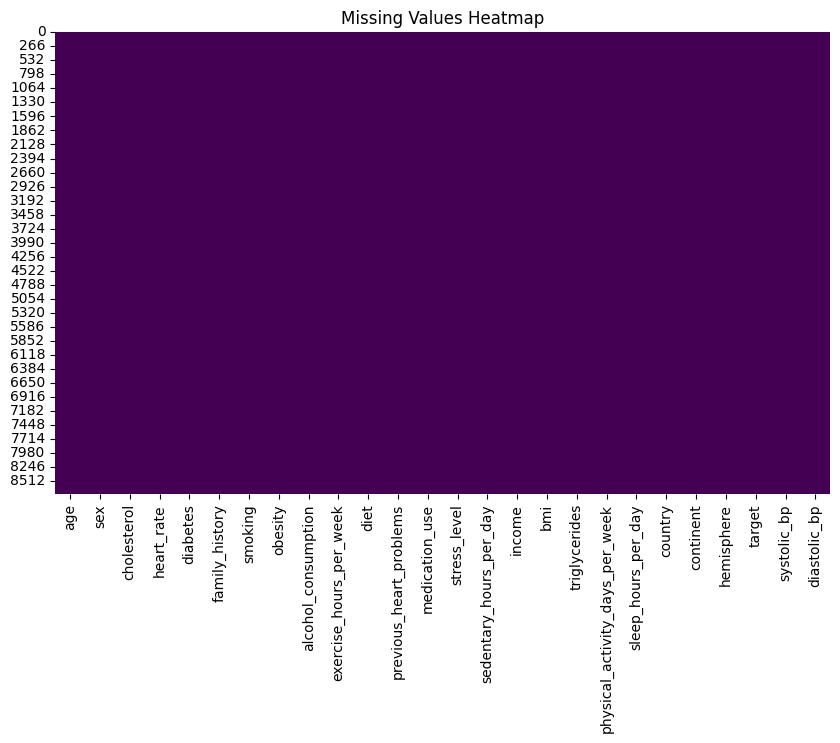

In [7]:
missing_vals = df.isnull().sum()
missing_pct = (missing_vals / len(df)) * 100
missing_df = pd.DataFrame({'Missing Values': missing_vals, 'Percentage': missing_pct})
print(missing_df[missing_df['Missing Values'] > 0])

plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [8]:
duplicate_count = df.duplicated().sum()
print(f"\nNumber of duplicate records: {duplicate_count}")


Number of duplicate records: 0


<h3>Plotting the pair plot</h3>

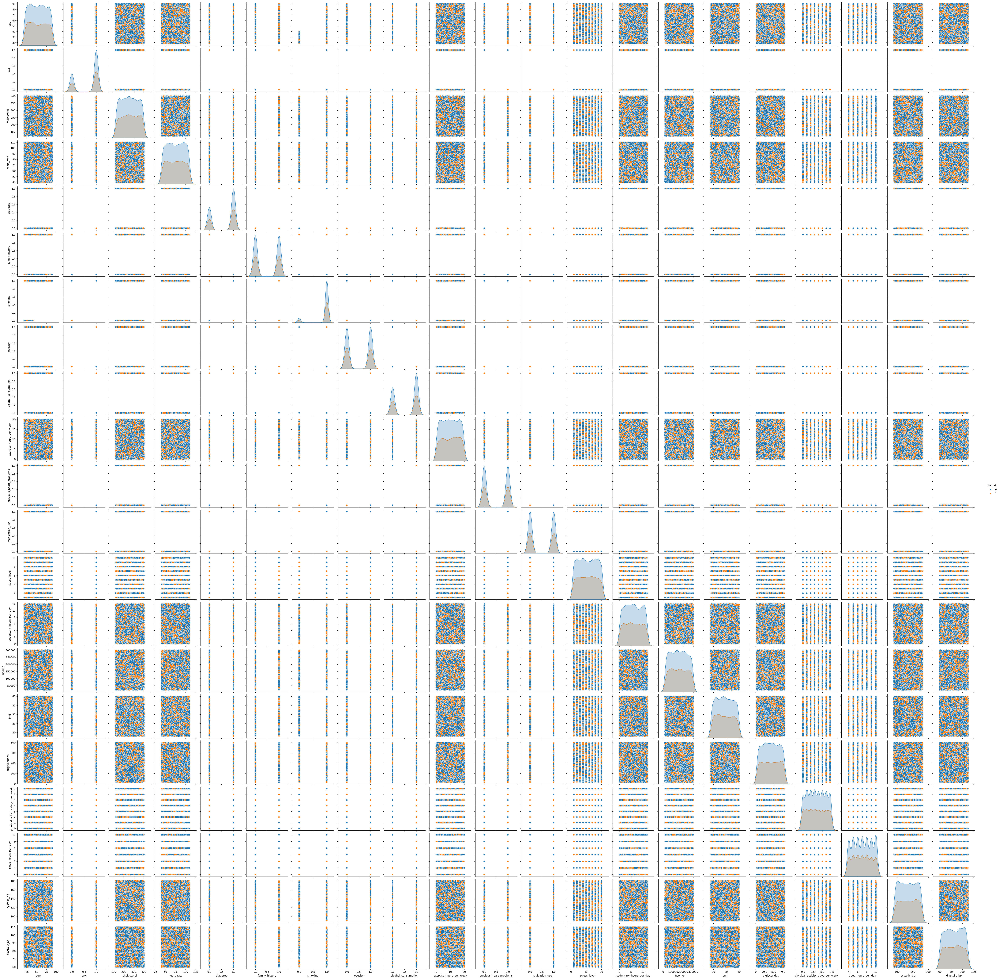

In [9]:
sns.pairplot(df, hue = 'target')

<h2>Handling and visualising the numerical features</h2>

In [10]:
# Auto-detect feature types for this dataset
numerical_cols = [c for c in df.select_dtypes(include=[np.number]).columns if c != 'target']
categorical_cols = [c for c in df.columns if c not in numerical_cols + ['target']]
print('Numerical columns:', numerical_cols)
print('Categorical columns:', categorical_cols)

Numerical columns: ['age', 'sex', 'cholesterol', 'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity', 'alcohol_consumption', 'exercise_hours_per_week', 'previous_heart_problems', 'medication_use', 'stress_level', 'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides', 'physical_activity_days_per_week', 'sleep_hours_per_day', 'systolic_bp', 'diastolic_bp']
Categorical columns: ['diet', 'country', 'continent', 'hemisphere']


In [11]:
for col in numerical_cols:
    print(f"\nValue counts for {col}:\n{df[col].value_counts()}")


Value counts for age:
age
90    152
42    150
33    147
59    147
29    137
     ... 
75    102
72    101
39    100
47     99
51     82
Name: count, Length: 73, dtype: int64

Value counts for sex:
sex
1    6111
0    2652
Name: count, dtype: int64

Value counts for cholesterol:
cholesterol
235    52
360    47
149    46
218    46
251    45
       ..
248    20
186    20
328    20
398    20
397    19
Name: count, Length: 281, dtype: int64

Value counts for heart_rate:
heart_rate
94     157
97     146
57     143
52     140
104    139
      ... 
70     107
48     107
79     105
96      97
73      93
Name: count, Length: 71, dtype: int64

Value counts for diabetes:
diabetes
1    5716
0    3047
Name: count, dtype: int64

Value counts for family_history:
family_history
0    4443
1    4320
Name: count, dtype: int64

Value counts for smoking:
smoking
1    7859
0     904
Name: count, dtype: int64

Value counts for obesity:
obesity
1    4394
0    4369
Name: count, dtype: int64

Value counts for al

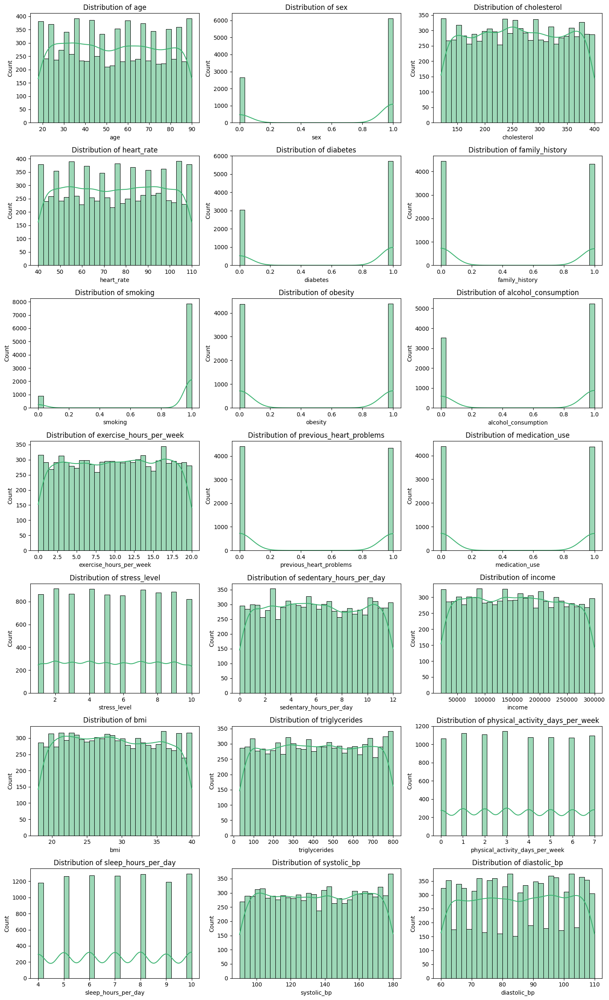

In [12]:


if len(numerical_cols) == 0:
    print('No numerical columns to plot.')
else:
    ncols = 3
    nrows = math.ceil(len(numerical_cols) / ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 3.5 * nrows))

    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]

    for i, col in enumerate(numerical_cols):
        ax = axes[i]
        sns.histplot(df[col], kde=True, bins=30, color='mediumseagreen', ax=ax)
        ax.set_title(f'Distribution of {col}')

    for ax in axes[len(numerical_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

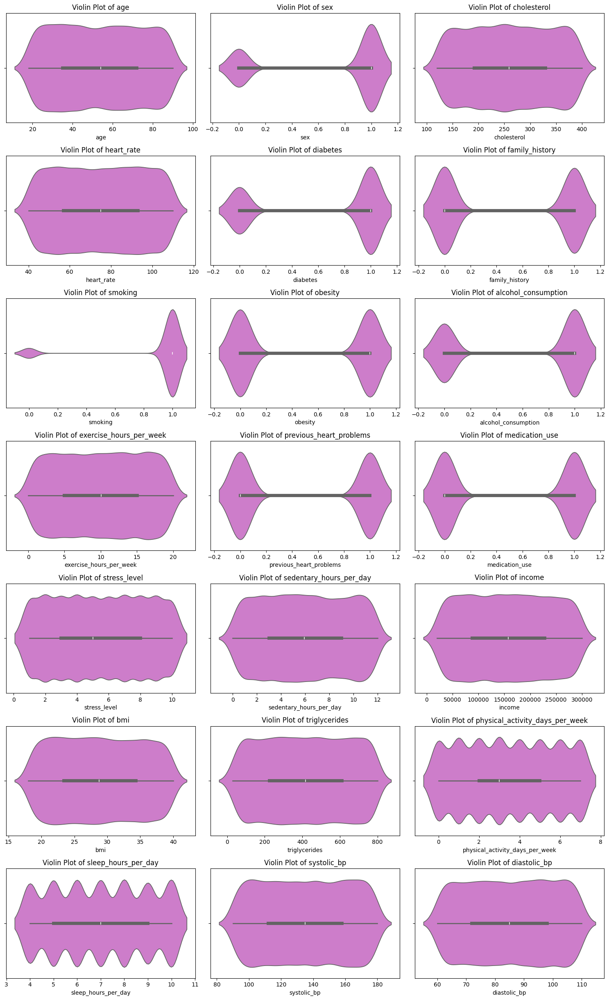

In [13]:
import math

if len(numerical_cols) == 0:
    print('No numerical columns to plot.')
else:
    ncols = 3
    nrows = math.ceil(len(numerical_cols) / ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 3.5 * nrows))

    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]

    for i, col in enumerate(numerical_cols):
        ax = axes[i]
        sns.violinplot(x=df[col], color='orchid', ax=ax)
        ax.set_title(f'Violin Plot of {col}')

    for ax in axes[len(numerical_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

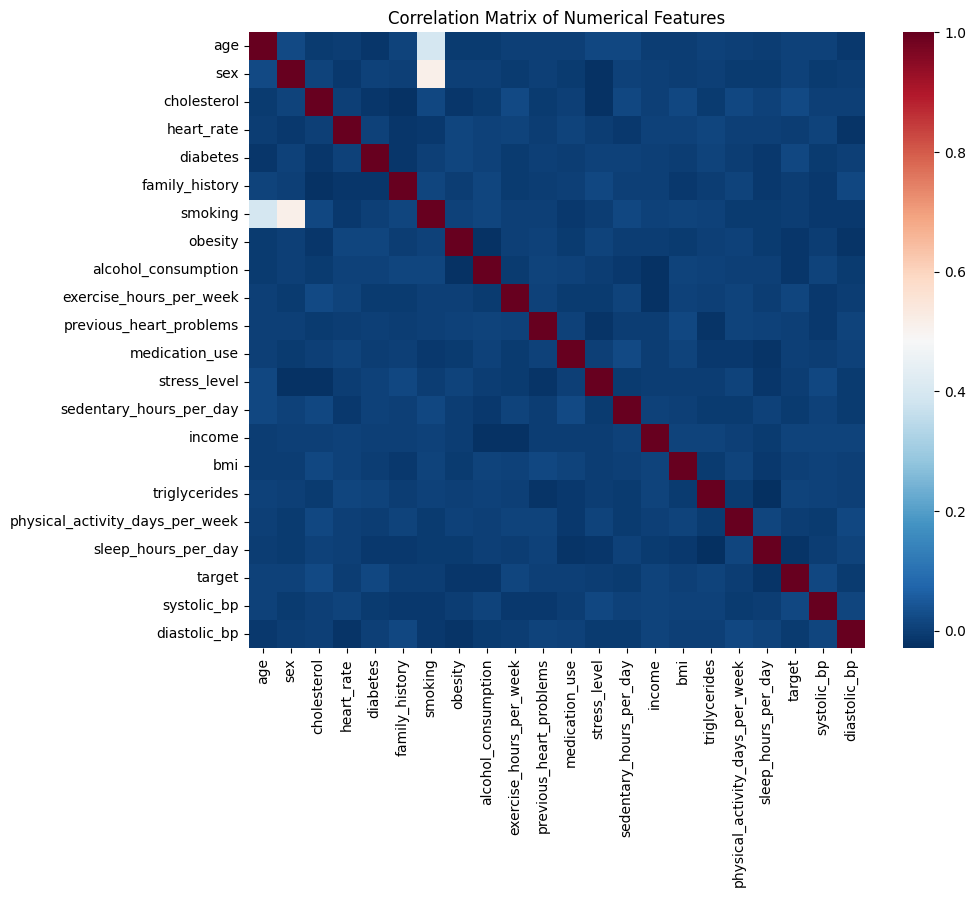

In [14]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(numeric_only=True), fmt=".2f", cmap='RdBu_r', square=True)
plt.title("Correlation Matrix of Numerical Features")
plt.show()

<h2>Analyzing Outliers</h2>

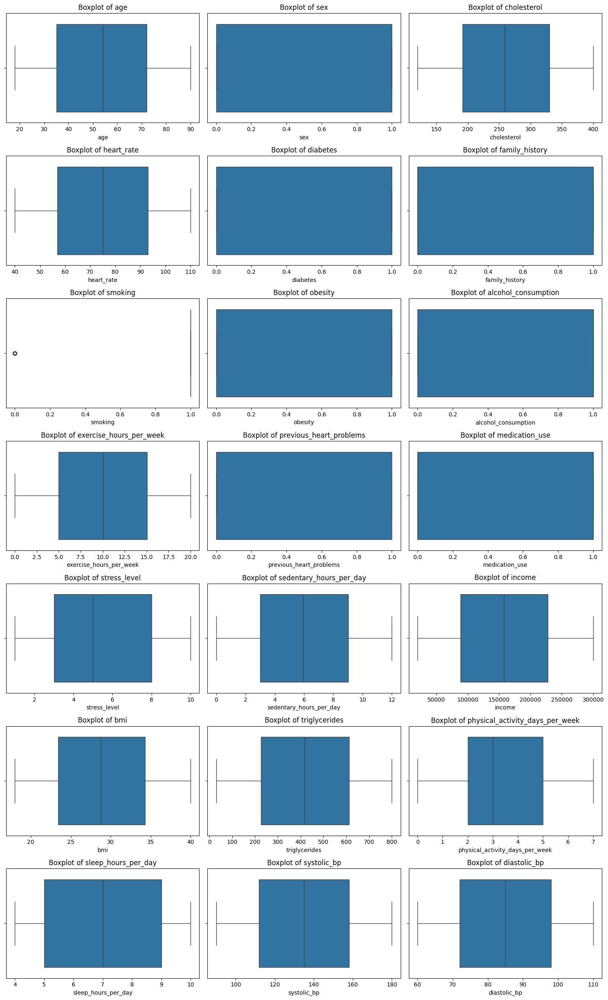

In [15]:
import math

if len(numerical_cols) == 0:
    print('No numerical columns to plot.')
else:
    ncols = 3
    nrows = math.ceil(len(numerical_cols) / ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 3.5 * nrows))

    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]

    for i, col in enumerate(numerical_cols):
        ax = axes[i]
        sns.boxplot(x=df[col], ax=ax)
        ax.set_title(f'Boxplot of {col}')

    for ax in axes[len(numerical_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

In [16]:
df[numerical_cols].skew()

age                                0.028498
sex                               -0.859374
cholesterol                       -0.000955
heart_rate                        -0.003227
diabetes                          -0.639647
family_history                     0.028080
smoking                           -2.609778
obesity                           -0.005707
alcohol_consumption               -0.400174
exercise_hours_per_week           -0.016387
previous_heart_problems            0.016664
medication_use                     0.006620
stress_level                       0.008389
sedentary_hours_per_day            0.017974
income                             0.021792
bmi                                0.035996
triglycerides                     -0.001915
physical_activity_days_per_week    0.017822
sleep_hours_per_day                0.000357
systolic_bp                       -0.002661
diastolic_bp                      -0.023375
dtype: float64

<h2>Handling and visualizing categorical features</h2>

In [17]:
for col in categorical_cols:
    print(f"\nValue counts for {col}:\n{df[col].value_counts()}")


Value counts for diet:
diet
Healthy      2960
Average      2912
Unhealthy    2891
Name: count, dtype: int64

Value counts for country:
country
Germany           477
Argentina         471
Brazil            462
United Kingdom    457
Australia         449
Nigeria           448
France            446
Canada            440
China             436
New Zealand       435
Japan             433
Italy             431
Spain             430
Colombia          429
Thailand          428
South Africa      425
Vietnam           425
United States     420
India             412
South Korea       409
Name: count, dtype: int64

Value counts for continent:
continent
Asia             2543
Europe           2241
South America    1362
Australia         884
Africa            873
North America     860
Name: count, dtype: int64

Value counts for hemisphere:
hemisphere
Northern Hemisphere    5660
Southern Hemisphere    3103
Name: count, dtype: int64


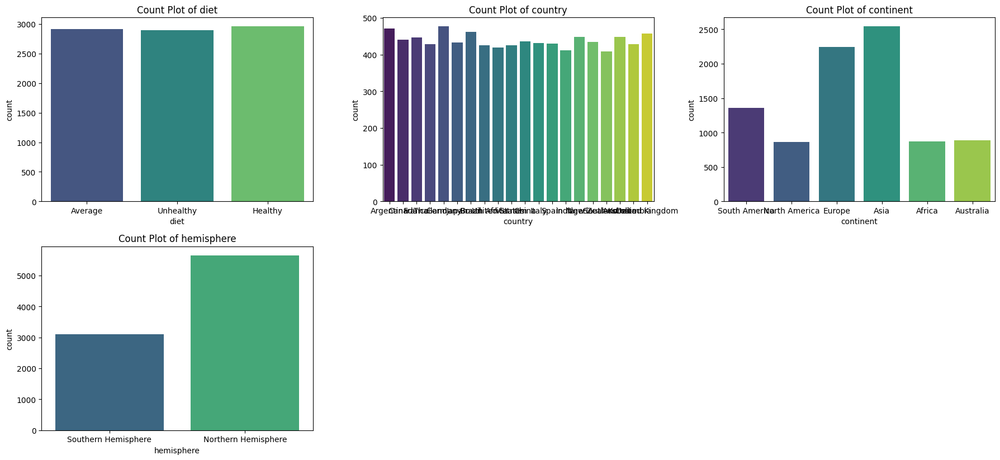

In [18]:
plt.figure(figsize=(18, 12))
for i, col in enumerate(categorical_cols):
    plt.subplot(3, 3, i + 1)
    sns.countplot(x=col, data=df, palette='viridis')
    plt.title(f'Count Plot of {col}')
plt.tight_layout()
plt.show()

<h2>Handling and visualizing the Target features "Num" that represents the heart disease</h2>

In [19]:
df[numerical_cols + ['target']].corr()['target'].sort_values(ascending=False)

target                             1.000000
cholesterol                        0.019340
systolic_bp                        0.018585
diabetes                           0.017225
exercise_hours_per_week            0.011133
triglycerides                      0.010471
income                             0.009628
age                                0.006403
sex                                0.003095
medication_use                     0.002234
previous_heart_problems            0.000274
bmi                                0.000020
family_history                    -0.001652
smoking                           -0.004051
stress_level                      -0.004111
heart_rate                        -0.004251
physical_activity_days_per_week   -0.005014
sedentary_hours_per_day           -0.005613
diastolic_bp                      -0.007509
obesity                           -0.013318
alcohol_consumption               -0.013778
sleep_hours_per_day               -0.018528
Name: target, dtype: float64

In [20]:
target_counts = df['target'].value_counts().sort_index()
print(target_counts)
target_percent = (target_counts / target_counts.sum()) * 100
print(target_percent)

target
0    5624
1    3139
Name: count, dtype: int64
target
0    64.178934
1    35.821066
Name: count, dtype: float64


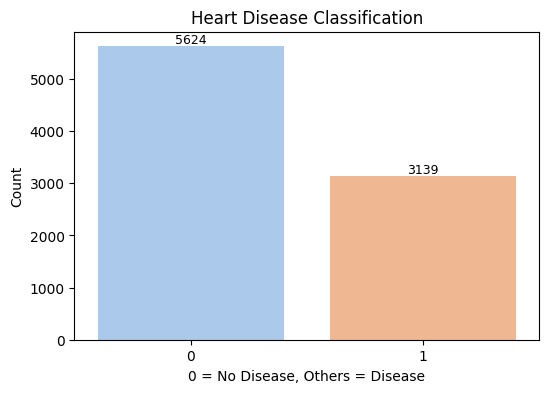

In [21]:
plt.figure(figsize=(6,4))
ax = sns.countplot(x='target', data=df, palette='pastel')

for p in ax.patches:
    count = int(p.get_height())
    ax.annotate(f'{count}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=9)

plt.title('Heart Disease Classification')
plt.xlabel('0 = No Disease, Others = Disease')
plt.ylabel('Count')
plt.show()


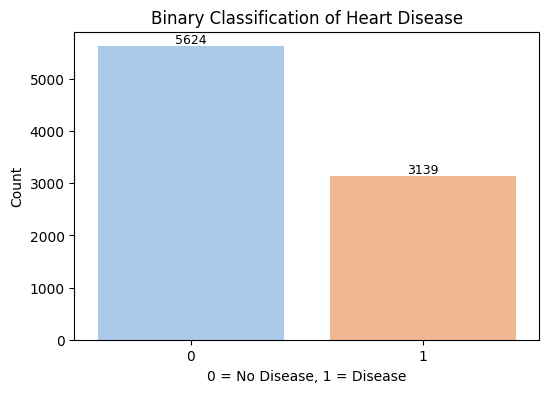

Target Class Counts:
 target
0    5624
1    3139
Name: count, dtype: int64

Target Class Percentages:
 target
0    64.178934
1    35.821066
Name: proportion, dtype: float64


In [22]:
plt.figure(figsize=(6,4))
ax = sns.countplot(x='target', data=df, palette='pastel')

for p in ax.patches:
    count = int(p.get_height())
    ax.annotate(f'{count}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=9)

plt.title('Binary Classification of Heart Disease')
plt.xlabel('0 = No Disease, 1 = Disease')
plt.ylabel('Count')
plt.show()

# Print counts separately
print("Target Class Counts:\n", df['target'].value_counts())
print("\nTarget Class Percentages:\n", df['target'].value_counts(normalize=True) * 100)


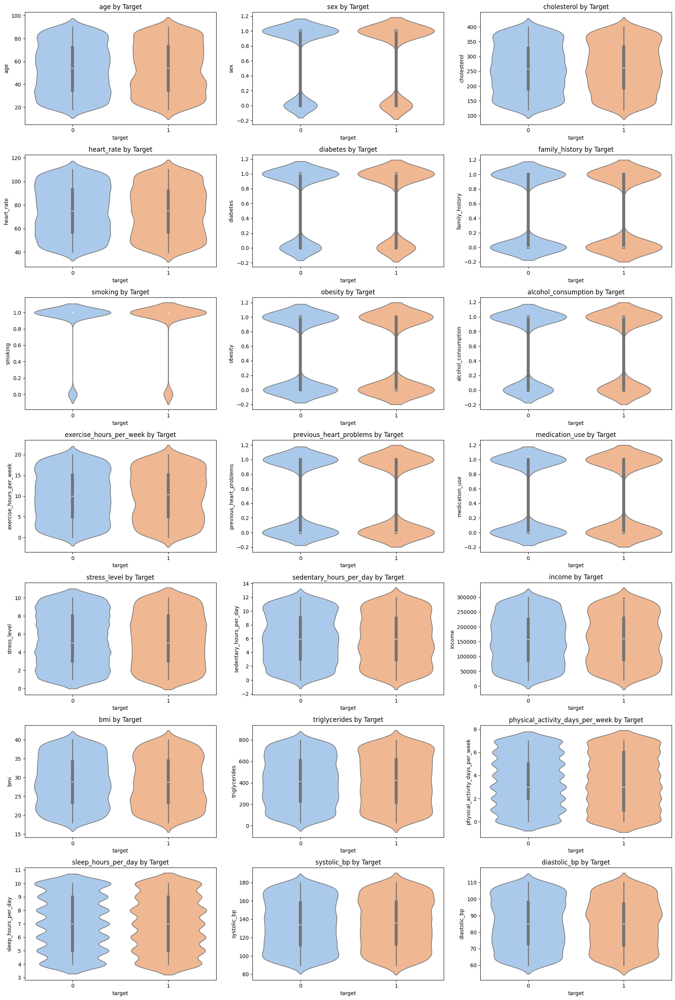

In [23]:
import math

if len(numerical_cols) == 0:
    print('No numerical columns to plot.')
else:
    ncols = 3
    nrows = math.ceil(len(numerical_cols) / ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 3.8 * nrows))

    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]

    for i, col in enumerate(numerical_cols):
        ax = axes[i]
        sns.violinplot(data=df, x='target', y=col, palette='pastel', ax=ax)
        ax.set_title(f'{col} by Target')

    for ax in axes[len(numerical_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()


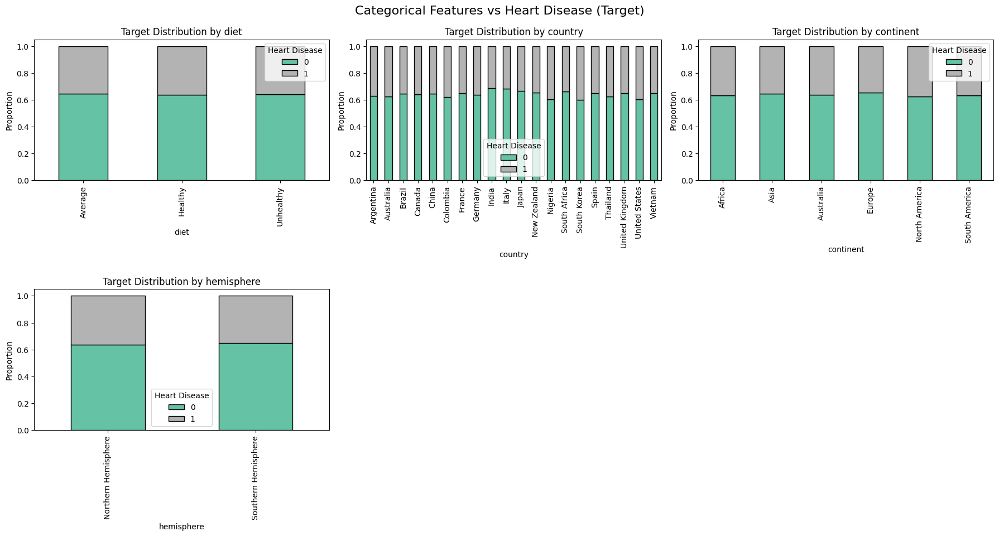

In [24]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    ct = pd.crosstab(df[col], df['target'], normalize='index')
    ct.plot(kind='bar', stacked=True, ax=axes[i], colormap='Set2', edgecolor='black')
    axes[i].set_title(f'Target Distribution by {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Proportion')
    axes[i].legend(title='Heart Disease', loc='best')

for j in range(len(categorical_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Categorical Features vs Heart Disease (Target)', fontsize=16, y=1.02)
plt.show()

<h3>T-Test for Numerical Columns</h3>

In [25]:
from scipy.stats import ttest_ind

print("T-tests for numerical columns:\n")
for col in numerical_cols:
    group0 = df[df['target'] == 0][col]
    group1 = df[df['target'] == 1][col]
    stat, p = ttest_ind(group0, group1, nan_policy='omit')
    print(f"{col}: p-value = {p:.4f} {'(Significant)' if p < 0.05 else '(Not significant)'}")

T-tests for numerical columns:

age: p-value = 0.5490 (Not significant)
sex: p-value = 0.7720 (Not significant)
cholesterol: p-value = 0.0702 (Not significant)
heart_rate: p-value = 0.6907 (Not significant)
diabetes: p-value = 0.1069 (Not significant)
family_history: p-value = 0.8771 (Not significant)
smoking: p-value = 0.7045 (Not significant)
obesity: p-value = 0.2126 (Not significant)
alcohol_consumption: p-value = 0.1972 (Not significant)
exercise_hours_per_week: p-value = 0.2974 (Not significant)
previous_heart_problems: p-value = 0.9796 (Not significant)
medication_use: p-value = 0.8343 (Not significant)
stress_level: p-value = 0.7004 (Not significant)
sedentary_hours_per_day: p-value = 0.5993 (Not significant)
income: p-value = 0.3675 (Not significant)
bmi: p-value = 0.9985 (Not significant)
triglycerides: p-value = 0.3270 (Not significant)
physical_activity_days_per_week: p-value = 0.6389 (Not significant)
sleep_hours_per_day: p-value = 0.0829 (Not significant)
systolic_bp: p-v

<h3>Chi-sqaure Test for Catgorical Columns</h3>

In [26]:
from scipy.stats import chi2_contingency
print("Chi-square test for categorical variables:\n")
for col in categorical_cols:
    table = pd.crosstab(df[col], df['target'])
    stat, p, _, _ = chi2_contingency(table)
    print(f"{col}: p-value = {p:.4f} {'(Significant)' if p < 0.05 else '(Not significant)'}")

Chi-square test for categorical variables:

diet: p-value = 0.6204 (Not significant)
country: p-value = 0.3767 (Not significant)
continent: p-value = 0.5734 (Not significant)
hemisphere: p-value = 0.2436 (Not significant)


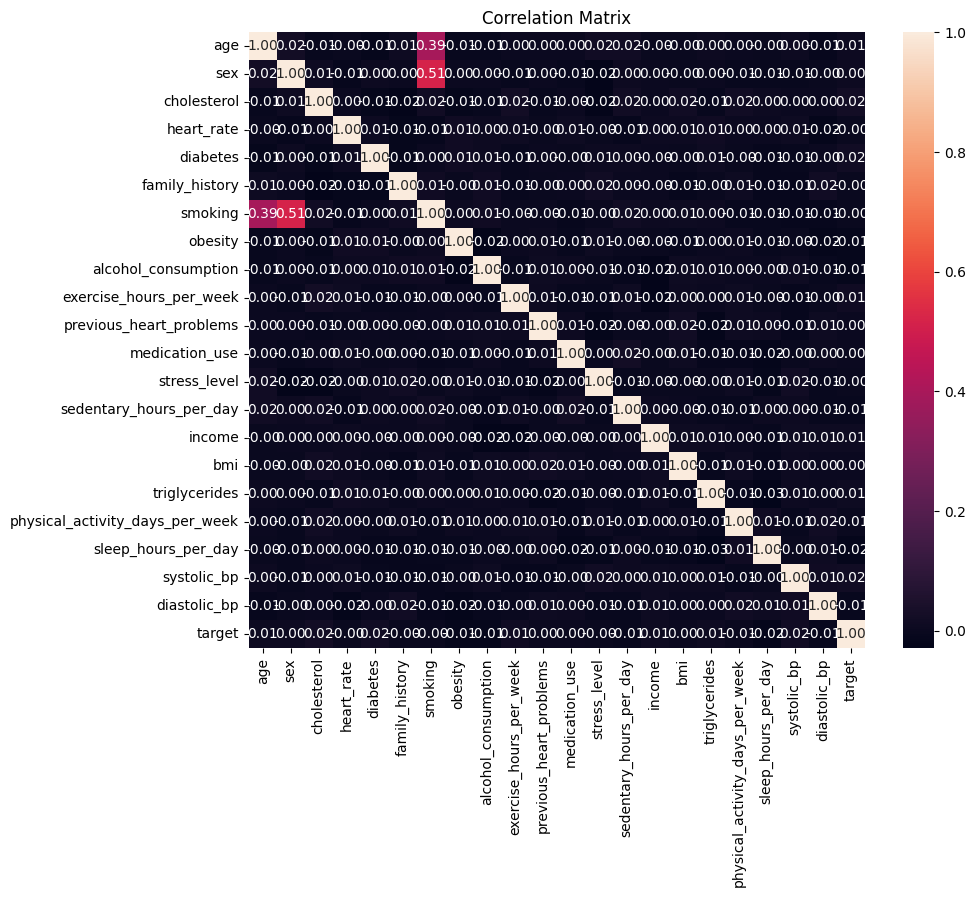

In [27]:
plt.figure(figsize=(10, 8))
sns.heatmap(df[numerical_cols + ['target']].corr(), annot=True, fmt=".2f", square=True)
plt.title("Correlation Matrix")
plt.show()

<h2>Analyzing the age column</h2>

In [28]:
df['age'].describe()

count    8763.000000
mean       53.707977
std        21.249509
min        18.000000
25%        35.000000
50%        54.000000
75%        72.000000
max        90.000000
Name: age, dtype: float64

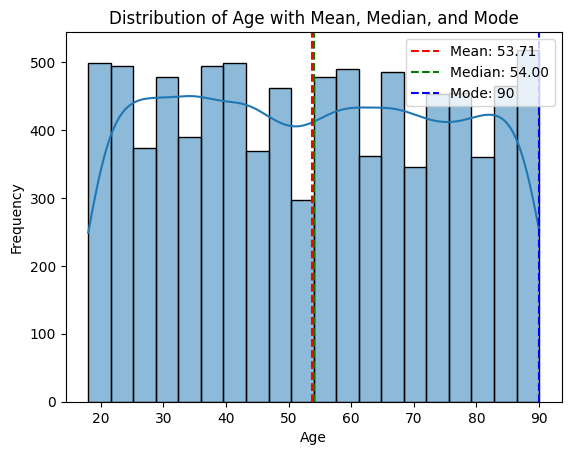

In [29]:
sns.histplot(df['age'], bins=20, kde=True)

plt.axvline(df['age'].mean(), color='red', linestyle='--', label=f"Mean: {df['age'].mean():.2f}")
plt.axvline(df['age'].median(), color='green', linestyle='--', label=f"Median: {df['age'].median():.2f}")
plt.axvline(df['age'].mode()[0], color='blue', linestyle='--', label=f"Mode: {df['age'].mode()[0]}")

plt.legend()
plt.title("Distribution of Age with Mean, Median, and Mode")
plt.xlabel("Age")
plt.ylabel("Frequency")

plt.show()


The age column distribution seems to be normaly distributed because we can clearly see the bill curve.

In [30]:
fig = px.histogram(data_frame=df, x='age')
fig.show()

print ("Mean of the dataset: ",df['age'].mean())
print ("Median of the dataset: ",df['age'].median())
print ("Mode of the dataset: ",df['age'].agg(pd.Series.mode))

Mean of the dataset:  53.70797672030127
Median of the dataset:  54.0
Mode of the dataset:  0    90
Name: age, dtype: int64


Lets explore the gender base distribution of the dataset for age column

Text(0.5, 1.0, 'Age vs Heart Disease')

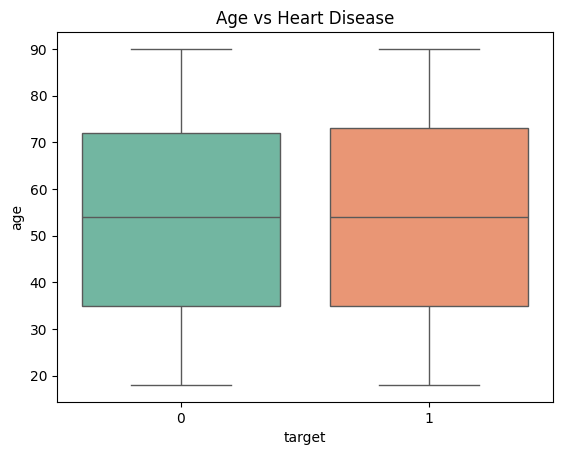

In [31]:
sns.boxplot(x='target', y='age', data=df, palette='Set2')
plt.title('Age vs Heart Disease')

In [32]:
from scipy.stats import ttest_ind
ttest_ind(df[df['target']==0]['age'], df[df['target']==1]['age'], nan_policy='omit')


TtestResult(statistic=np.float64(-0.5993519702132762), pvalue=np.float64(0.5489536967579363), df=np.float64(8761.0))

Text(0.5, 1.0, 'Age vs heart_rate by Target')

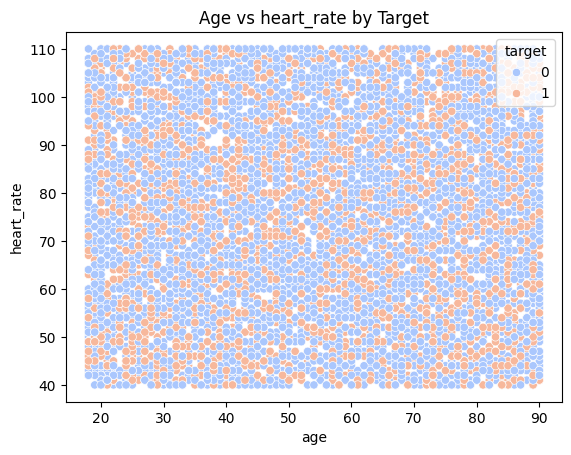

In [33]:
# Use dataset-appropriate heart rate column
if 'thalach' in df.columns:
    y_col = 'thalach'
elif 'heart_rate' in df.columns:
    y_col = 'heart_rate'
elif 'max_heart_rate' in df.columns:
    y_col = 'max_heart_rate'
else:
    # Fallback: pick any numeric column other than age/target
    candidates = [c for c in df.select_dtypes(include='number').columns if c not in {'age', 'target'}]
    if not candidates:
        raise ValueError("No suitable numeric column found for y-axis")
    y_col = candidates[0]

sns.scatterplot(x='age', y=y_col, hue='target', data=df, palette='coolwarm')
plt.title(f"Age vs {y_col} by Target")


In [34]:
fig = px.histogram(data_frame=df, x='age', color= 'sex')
fig.show()

In [35]:
df['sex'].value_counts()

sex
1    6111
0    2652
Name: count, dtype: int64

<Axes: xlabel='sex', ylabel='count'>

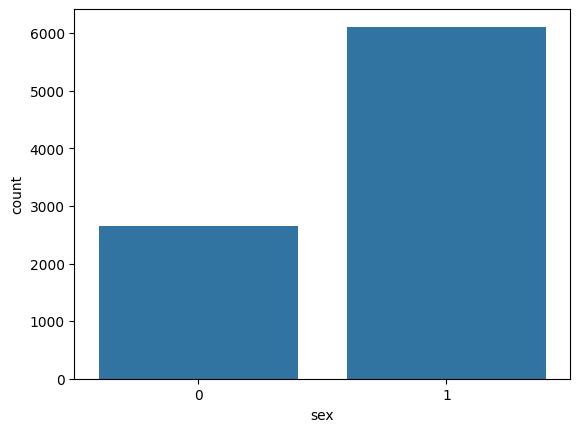

In [36]:
sns.countplot(df,x='sex')

In [37]:
male_count = 206
female_count = 97

total_count = male_count + female_count

# calculate percentages
male_percentage = (male_count/total_count)*100
female_percentages = (female_count/total_count)*100

# display the results
print(f'Male percentage in the data: {male_percentage:.2f}%')
print(f'Female percentage in the data : {female_percentages:.2f}%')

# Difference
difference_percentage = ((male_count - female_count)/female_count) * 100
print(f'Males are {difference_percentage:.2f}% more than female in the data.')


Male percentage in the data: 67.99%
Female percentage in the data : 32.01%
Males are 112.37% more than female in the data.


In [38]:
df.groupby('sex')['age'].value_counts()

sex  age
0    25     49
     68     48
     74     48
     28     47
     33     47
            ..
1    39     70
     47     70
     40     69
     23     67
     51     51
Name: count, Length: 146, dtype: int64

<h2>Missing Values</h2>

This dataset has no missing values, so we skip the imputation step that was specific to a different dataset.

In [39]:
# No imputation needed for this dataset (no missing values).
(df.isnull().sum()).sort_values(ascending=False).head(10)

age                                0
sex                                0
systolic_bp                        0
target                             0
hemisphere                         0
continent                          0
country                            0
sleep_hours_per_day                0
physical_activity_days_per_week    0
triglycerides                      0
dtype: int64

In [40]:
# let's check again for missing values
(df.isnull().sum()).sort_values(ascending=False)

age                                0
sex                                0
systolic_bp                        0
target                             0
hemisphere                         0
continent                          0
country                            0
sleep_hours_per_day                0
physical_activity_days_per_week    0
triglycerides                      0
bmi                                0
income                             0
sedentary_hours_per_day            0
stress_level                       0
medication_use                     0
previous_heart_problems            0
diet                               0
exercise_hours_per_week            0
alcohol_consumption                0
obesity                            0
smoking                            0
family_history                     0
diabetes                           0
heart_rate                         0
cholesterol                        0
diastolic_bp                       0
dtype: int64

Now Missing values are imputed and there is no missing values in the columns....

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   age                              8763 non-null   int64  
 1   sex                              8763 non-null   int64  
 2   cholesterol                      8763 non-null   int64  
 3   heart_rate                       8763 non-null   int64  
 4   diabetes                         8763 non-null   int64  
 5   family_history                   8763 non-null   int64  
 6   smoking                          8763 non-null   int64  
 7   obesity                          8763 non-null   int64  
 8   alcohol_consumption              8763 non-null   int64  
 9   exercise_hours_per_week          8763 non-null   float64
 10  diet                             8763 non-null   object 
 11  previous_heart_problems          8763 non-null   int64  
 12  medication_use      

In [42]:
df.columns

Index(['age', 'sex', 'cholesterol', 'heart_rate', 'diabetes', 'family_history',
       'smoking', 'obesity', 'alcohol_consumption', 'exercise_hours_per_week',
       'diet', 'previous_heart_problems', 'medication_use', 'stress_level',
       'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides',
       'physical_activity_days_per_week', 'sleep_hours_per_day', 'country',
       'continent', 'hemisphere', 'target', 'systolic_bp', 'diastolic_bp'],
      dtype='object')

In [43]:
X = df.drop(['target'], axis=1)
y = df['target']

<h3>Splitting the dataset into training and testing sets</h3>

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [45]:
# Select numeric columns that actually exist (dataset-aware)
import pandas as pd
num_cols = [c for c in X_train.columns if pd.api.types.is_numeric_dtype(X_train[c])]
print('Scaling numeric columns:', num_cols)


Scaling numeric columns: ['age', 'sex', 'cholesterol', 'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity', 'alcohol_consumption', 'exercise_hours_per_week', 'previous_heart_problems', 'medication_use', 'stress_level', 'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides', 'physical_activity_days_per_week', 'sleep_hours_per_day', 'systolic_bp', 'diastolic_bp']


In [46]:
scaler = StandardScaler()

X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

if len(num_cols) > 0:
    X_train_scaled[num_cols] = scaler.fit_transform(X_train_scaled[num_cols])
    X_test_scaled[num_cols] = scaler.transform(X_test_scaled[num_cols])


In [47]:
# Preprocessing for models: scale numerics + one-hot encode categoricals
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

numeric_features = [c for c in X_train.columns if pd.api.types.is_numeric_dtype(X_train[c])]
categorical_features = [c for c in X_train.columns if c not in numeric_features]

preprocess = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='drop'
)

print('Numeric features:', numeric_features)
print('Categorical features:', categorical_features)


Numeric features: ['age', 'sex', 'cholesterol', 'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity', 'alcohol_consumption', 'exercise_hours_per_week', 'previous_heart_problems', 'medication_use', 'stress_level', 'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides', 'physical_activity_days_per_week', 'sleep_hours_per_day', 'systolic_bp', 'diastolic_bp']
Categorical features: ['diet', 'country', 'continent', 'hemisphere']


<h2>MODEL DEVELOPMENT</h2>

<h3>1. Logistic Regression</h3>

In [48]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

pipe = Pipeline([
    ('preprocess', preprocess),
    ('logreg', LogisticRegression(max_iter=2000))
])

param_grid = {
    'logreg__penalty': ['l1', 'l2', 'elasticnet'],
    'logreg__C': np.logspace(-3, 3, 7),
    'logreg__solver': ['saga'],
    'logreg__l1_ratio': [0, 0.25, 0.5, 0.75, 1],
}

grid = GridSearchCV(pipe, param_grid, cv=cv, scoring='f1', n_jobs=-1, error_score='raise')
grid.fit(X_train, y_train)

cal_lgr = CalibratedClassifierCV(grid.best_estimator_, cv=cv)
cal_lgr.fit(X_train, y_train)

y_pred = cal_lgr.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.00      0.00      0.00       628

    accuracy                           0.64      1753
   macro avg       0.32      0.50      0.39      1753
weighted avg       0.41      0.64      0.50      1753



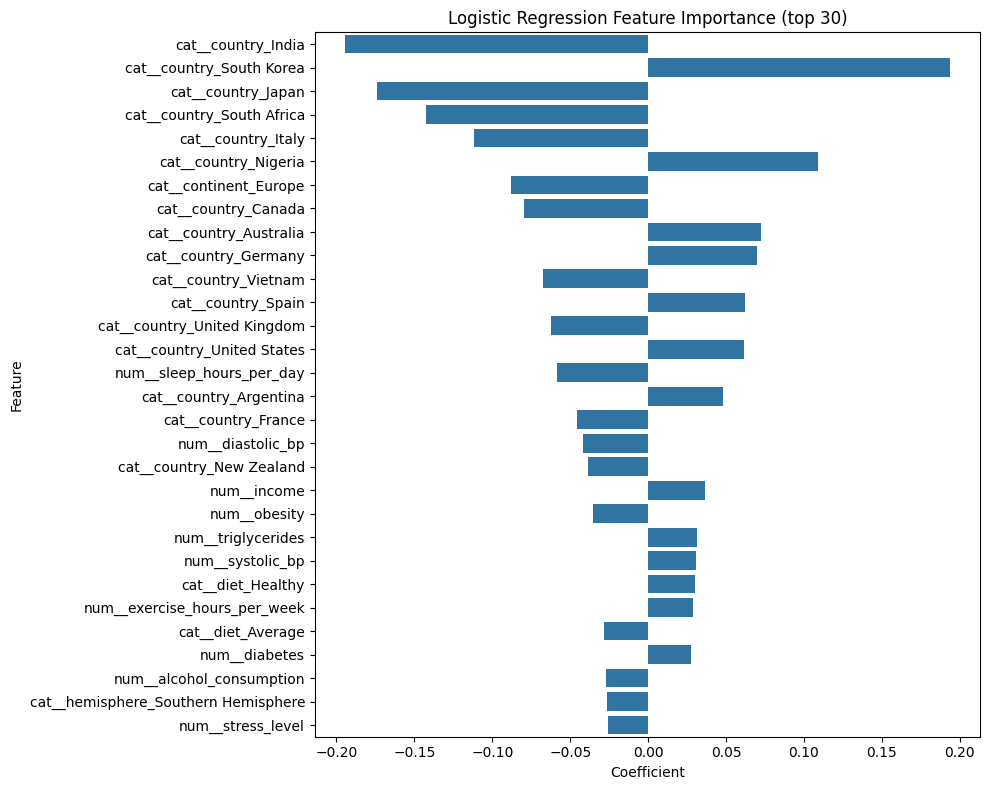

In [49]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

best_pipe = grid.best_estimator_
feature_names = best_pipe.named_steps['preprocess'].get_feature_names_out()
coef = best_pipe.named_steps['logreg'].coef_[0]

importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coef})
importance_df = importance_df.sort_values(by='Coefficient', key=abs, ascending=False).head(30)

plt.figure(figsize=(10, 8))
sns.barplot(data=importance_df, x='Coefficient', y='Feature')
plt.title('Logistic Regression Feature Importance (top 30)')
plt.tight_layout()
plt.show()


<h3>2. K-Nearest Neighbors (KNN)</h3>

In [50]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

knn_pipeline = Pipeline([
    ('preprocess', preprocess),
    ('knn', KNeighborsClassifier())
])

param_grid_knn = {
    'knn__n_neighbors': list(range(3, 22, 2)),
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan', 'minkowski'],
}

cal_knn = GridSearchCV(knn_pipeline, param_grid_knn, cv=cv, scoring='f1', n_jobs=-1)
cal_knn.fit(X_train, y_train)

y_pred_knn = cal_knn.predict(X_test)
print('Best KNN params:', cal_knn.best_params_)
print(classification_report(y_test, y_pred_knn))


Best KNN params: {'knn__metric': 'manhattan', 'knn__n_neighbors': 3, 'knn__weights': 'distance'}
              precision    recall  f1-score   support

           0       0.63      0.70      0.66      1125
           1       0.32      0.26      0.29       628

    accuracy                           0.54      1753
   macro avg       0.47      0.48      0.47      1753
weighted avg       0.52      0.54      0.53      1753



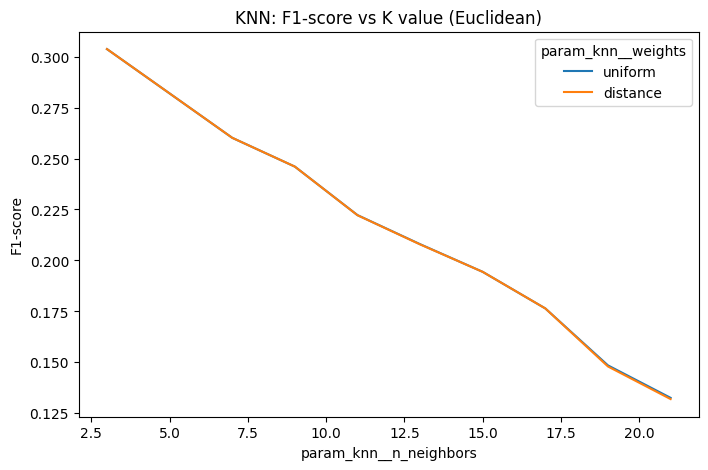

In [51]:
results = pd.DataFrame(cal_knn.cv_results_)
scores_k = results[results['param_knn__metric'] == 'euclidean']

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.lineplot(data=scores_k, x='param_knn__n_neighbors', y='mean_test_score', hue='param_knn__weights')
plt.title("KNN: F1-score vs K value (Euclidean)")
plt.ylabel("F1-score")
plt.show()


<h3>3. Support Vector Machine (SVM)</h3>

In [52]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report

svm_pipeline = Pipeline([
    ('preprocess', preprocess),
    ('svm', SVC(probability=True, class_weight='balanced'))
])

param_grid_svm = {
    'svm__kernel': ['linear', 'rbf', 'poly'],
    'svm__C': [0.1, 1, 10],
    'svm__gamma': ['scale', 'auto'],
    'svm__degree': [2, 3],
}

grid_svm = GridSearchCV(svm_pipeline, param_grid=param_grid_svm, cv=cv, scoring='f1', n_jobs=-1)
grid_svm.fit(X_train, y_train)

cal_svm = CalibratedClassifierCV(estimator=grid_svm.best_estimator_, cv=cv)
cal_svm.fit(X_train, y_train)

y_pred_svm = cal_svm.predict(X_test)
print('Best SVM Params:', grid_svm.best_params_)
print(classification_report(y_test, y_pred_svm))


Best SVM Params: {'svm__C': 0.1, 'svm__degree': 2, 'svm__gamma': 'auto', 'svm__kernel': 'poly'}
              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.00      0.00      0.00       628

    accuracy                           0.64      1753
   macro avg       0.32      0.50      0.39      1753
weighted avg       0.41      0.64      0.50      1753



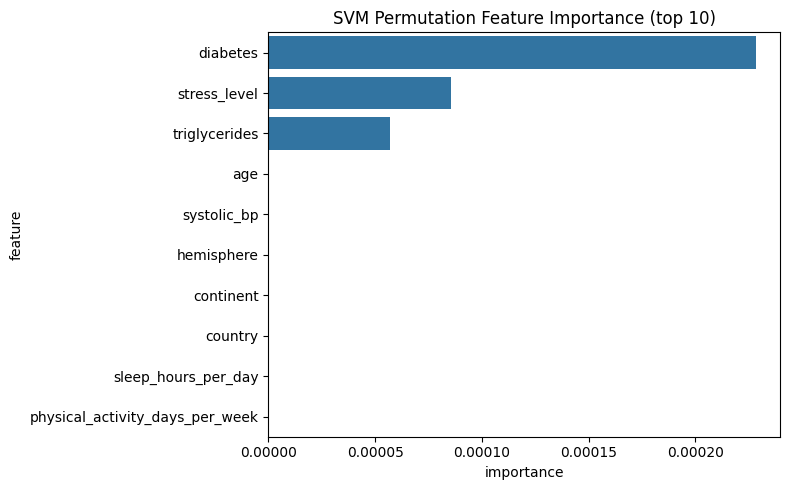

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.inspection import permutation_importance
import pandas as pd

best_svm = grid_svm.best_estimator_
perm_importance = permutation_importance(best_svm, X_test, y_test, n_repeats=20, random_state=42)

importances = pd.DataFrame({
    'feature': X_test.columns,
    'importance': perm_importance.importances_mean,
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(data=importances.head(10), y='feature', x='importance')
plt.title('SVM Permutation Feature Importance (top 10)')
plt.tight_layout()
plt.show()


<h3>4. Random Forest Classifier (RF) </h3>

In [54]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report

rf_pipeline = Pipeline([
    ('preprocess', preprocess),
    ('rf', RandomForestClassifier(class_weight='balanced', random_state=42))
])

param_grid_rf = {
    'rf__n_estimators': [100, 200],
    'rf__max_depth': [None, 5, 10],
    'rf__min_samples_split': [2, 5],
    'rf__max_features': ['sqrt', 'log2'],
}

grid_rf = GridSearchCV(rf_pipeline, param_grid_rf, cv=cv, scoring='f1', n_jobs=-1)
grid_rf.fit(X_train, y_train)

cal_rf = CalibratedClassifierCV(grid_rf.best_estimator_, cv=cv)
cal_rf.fit(X_train, y_train)

y_pred_rf = cal_rf.predict(X_test)
print('Best RF Params:', grid_rf.best_params_)
print(classification_report(y_test, y_pred_rf))


Best RF Params: {'rf__max_depth': 5, 'rf__max_features': 'log2', 'rf__min_samples_split': 5, 'rf__n_estimators': 100}
              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.00      0.00      0.00       628

    accuracy                           0.64      1753
   macro avg       0.32      0.50      0.39      1753
weighted avg       0.41      0.64      0.50      1753



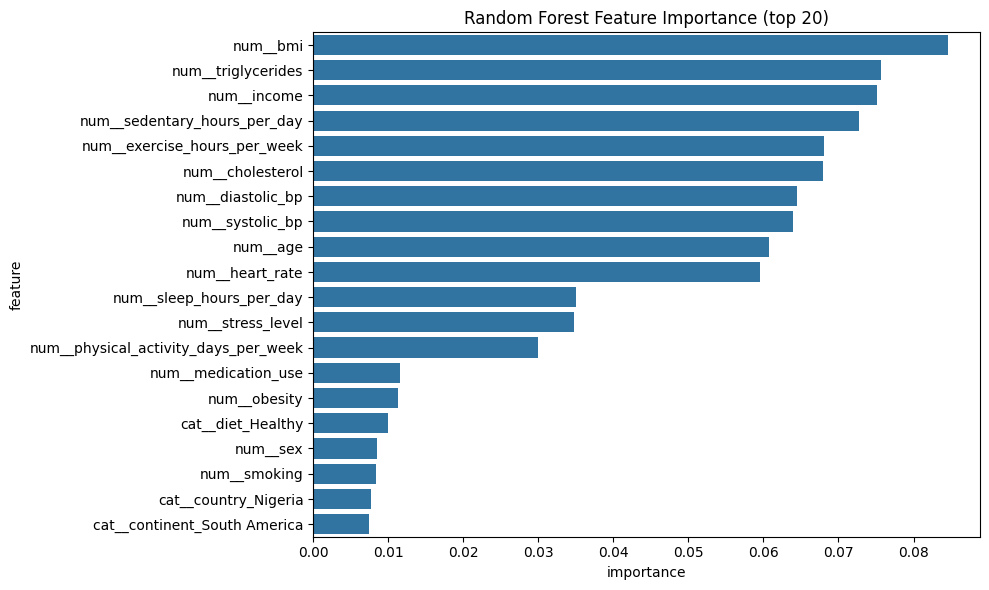

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

best_rf_pipe = grid_rf.best_estimator_
feature_names = best_rf_pipe.named_steps['preprocess'].get_feature_names_out()
importances = best_rf_pipe.named_steps['rf'].feature_importances_

feat_imp = pd.DataFrame({'feature': feature_names, 'importance': importances})
feat_imp = feat_imp.sort_values(by='importance', ascending=False).head(20)

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp, y='feature', x='importance')
plt.title('Random Forest Feature Importance (top 20)')
plt.tight_layout()
plt.show()


<h3>5. XGBoost Classifier</h3>

Best XGBoost Params: {'xgb__learning_rate': 0.05, 'xgb__max_depth': 5, 'xgb__n_estimators': 350}
              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.00      0.00      0.00       628

    accuracy                           0.64      1753
   macro avg       0.32      0.50      0.39      1753
weighted avg       0.41      0.64      0.50      1753



<Figure size 1000x500 with 0 Axes>

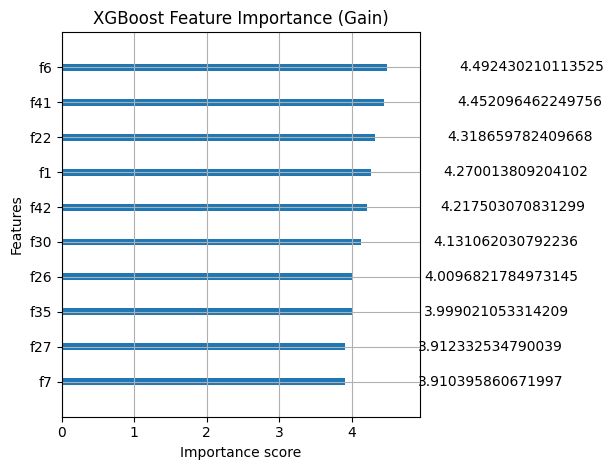

In [56]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

cv_xgb = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

xgb_pipeline = Pipeline([
    ('preprocess', preprocess),
    ('xgb', XGBClassifier(
        random_state=42,
        eval_metric='logloss',
        tree_method='hist',
        n_jobs=2,
    )),
])

# Keep this intentionally small so the notebook runs quickly.
param_grid_xgb = {
    'xgb__n_estimators': [350],
    'xgb__max_depth': [5],
    'xgb__learning_rate': [0.05],
}

grid_xgb = GridSearchCV(
    xgb_pipeline,
    param_grid_xgb,
    cv=cv_xgb,
    scoring='f1',
    n_jobs=1,
)
grid_xgb.fit(X_train, y_train)

cal_xgb = CalibratedClassifierCV(grid_xgb.best_estimator_, cv=cv_xgb)
cal_xgb.fit(X_train, y_train)

y_pred_xgb = cal_xgb.predict(X_test)
print('Best XGBoost Params:', grid_xgb.best_params_)
print(classification_report(y_test, y_pred_xgb))

plt.figure(figsize=(10, 5))
plot_importance(grid_xgb.best_estimator_.named_steps['xgb'], importance_type='gain', max_num_features=10)
plt.title('XGBoost Feature Importance (Gain)')
plt.tight_layout()
plt.show()


<h3>6. Light GBM</h3>

[LightGBM] [Info] Number of positive: 1674, number of negative: 2999
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1925
[LightGBM] [Info] Number of data points in the train set: 4673, number of used features: 52
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 1674, number of negative: 2999
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1923
[LightGBM] [Info] Number of data points in the train set: 4673, number of used features: 52
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGB

<Figure size 1000x500 with 0 Axes>

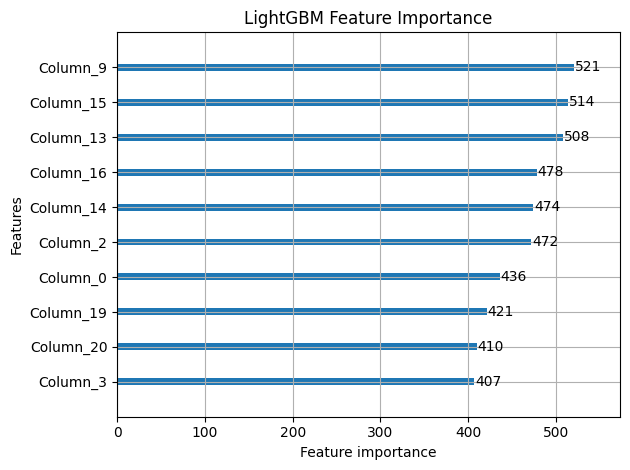

In [57]:
from lightgbm import LGBMClassifier, plot_importance
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

cv_lgb = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

lgb_pipeline = Pipeline([
    ('preprocess', preprocess),
    ('lgb', LGBMClassifier(
        random_state=42,
        class_weight='balanced',
    )),
])

# Keep this intentionally small so the notebook runs quickly.
param_grid_lgb = {
    'lgb__n_estimators': [200],
    'lgb__num_leaves': [31],
    'lgb__learning_rate': [0.1],
}

grid_lgb = GridSearchCV(
    lgb_pipeline,
    param_grid_lgb,
    cv=cv_lgb,
    scoring='f1',
    n_jobs=1,
)
grid_lgb.fit(X_train, y_train)

cal_lgb = CalibratedClassifierCV(grid_lgb.best_estimator_, cv=cv_lgb)
cal_lgb.fit(X_train, y_train)

y_pred_lgb = cal_lgb.predict(X_test)
print('Best LightGBM Params:', grid_lgb.best_params_)
print(classification_report(y_test, y_pred_lgb))

plt.figure(figsize=(10, 5))
plot_importance(grid_lgb.best_estimator_.named_steps['lgb'], max_num_features=10)
plt.title('LightGBM Feature Importance')
plt.tight_layout()
plt.show()


<h2>Evaluation of Traditional Machine learning models </h2>

In [58]:
models = {
    'Logistic Regression': cal_lgr,  
    'KNN': cal_knn,            
    'SVM': cal_svm,
    'Random Forest': cal_rf,
    'XGBoost': cal_xgb,
    'LightGBM': cal_lgb
}

In [59]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd

def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    return {
        'Model': name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-score': f1_score(y_test, y_pred),
        'Best Params': getattr(model, 'best_params_', 'N/A') 
    }

def evaluate_all_models(models: dict, X_test, y_test):
    results = [evaluate_model(name, model, X_test, y_test) for name, model in models.items()]
    df_results = pd.DataFrame(results).sort_values(by='F1-score', ascending=False)
    
    print("Model Comparison:\n")
    print(df_results[['Model', 'Accuracy', 'Precision', 'Recall', 'F1-score']])
    
    best_model_row = df_results.iloc[0]
    print(f"\nBest Model: {best_model_row['Model']}")
    
    return df_results


In [60]:
df_results = evaluate_all_models(models, X_test, y_test)

Model Comparison:

                 Model  Accuracy  Precision    Recall  F1-score
1                  KNN  0.538505   0.320792  0.257962  0.285966
0  Logistic Regression  0.641757   0.000000  0.000000  0.000000
2                  SVM  0.641757   0.000000  0.000000  0.000000
3        Random Forest  0.641757   0.000000  0.000000  0.000000
4              XGBoost  0.641757   0.000000  0.000000  0.000000
5             LightGBM  0.641757   0.000000  0.000000  0.000000

Best Model: KNN


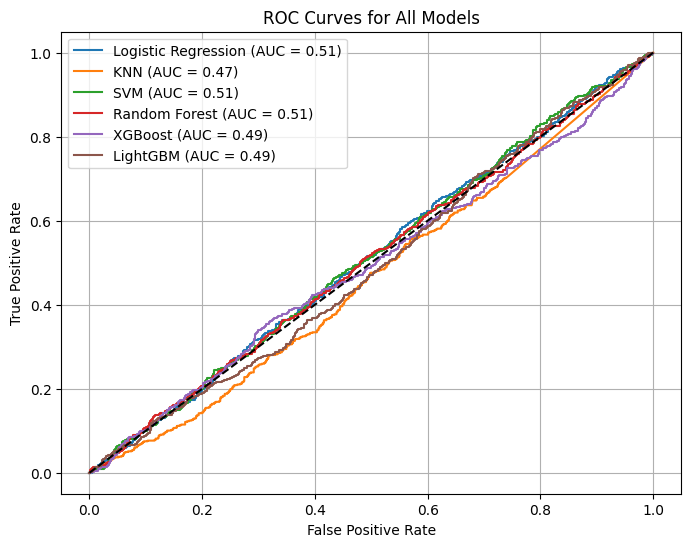

In [61]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

for name, model in models.items():
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curves for All Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.show()


<Figure size 640x480 with 0 Axes>

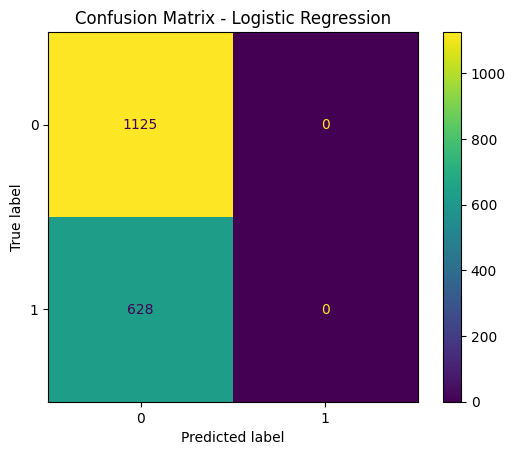

<Figure size 640x480 with 0 Axes>

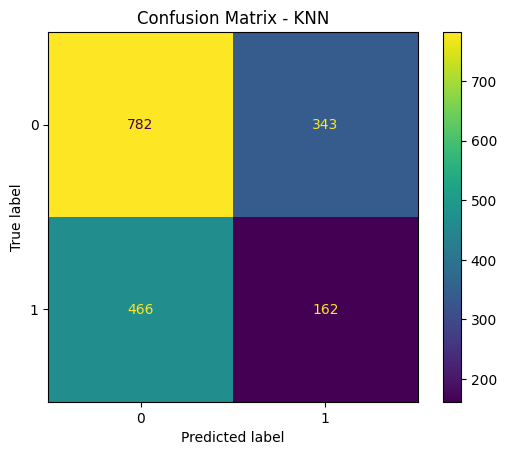

<Figure size 640x480 with 0 Axes>

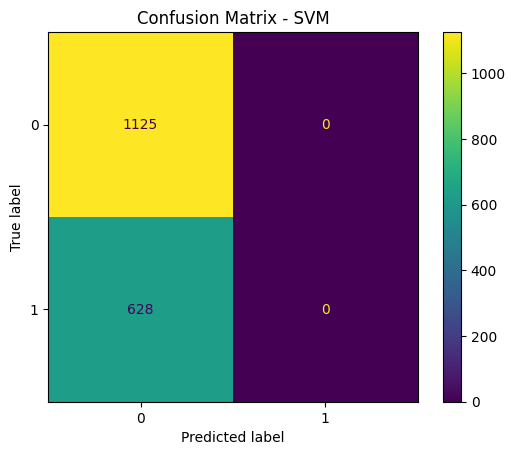

<Figure size 640x480 with 0 Axes>

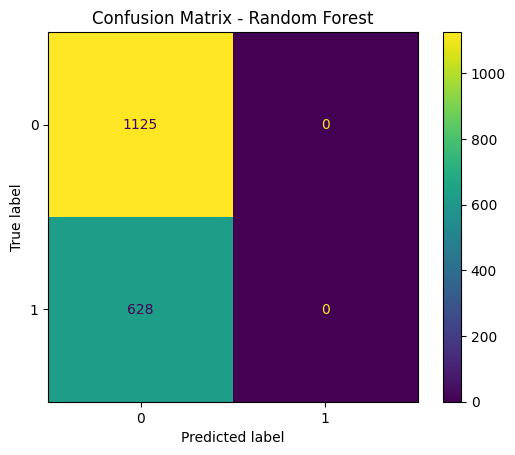

<Figure size 640x480 with 0 Axes>

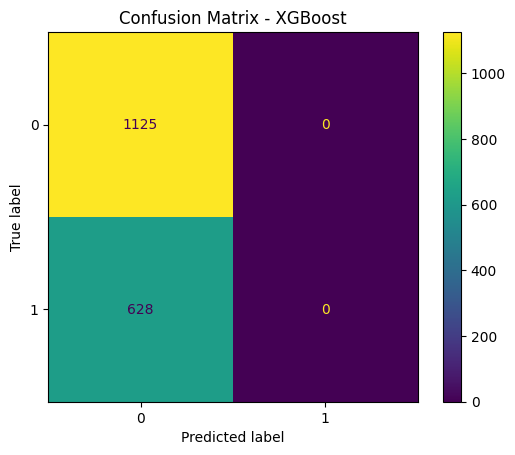

<Figure size 640x480 with 0 Axes>

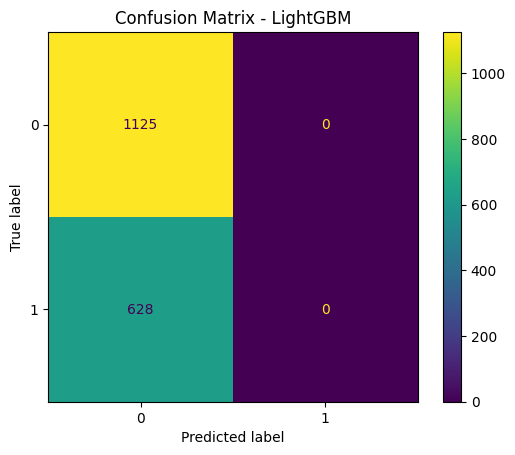

In [62]:
from sklearn.metrics import ConfusionMatrixDisplay

for name, model in models.items():
    plt.figure()
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)
    plt.title(f"Confusion Matrix - {name}")
    plt.grid(False)
    plt.show()


<h3>Evaluation Metrics</h3>

In [63]:
required = ['cal_lgr', 'cal_knn', 'cal_svm', 'cal_rf', 'cal_xgb', 'cal_lgb']
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError(
        'Missing trained model variables: ' + ', '.join(missing) +
        '. Run the model-training cells (LogReg/KNN/SVM/RF/XGB/LGB) first.'
    )

all_models = {
    'Logistic Regression': cal_lgr,
    'KNN': cal_knn,
    'SVM': cal_svm,
    'Random Forest': cal_rf,
    'XGBoost': cal_xgb,
    'LightGBM': cal_lgb,
}


In [64]:
results = []

# scikit-learn models
results.append(evaluate_model("Logistic Regression", cal_lgr, X_test, y_test))
results.append(evaluate_model("KNN", cal_knn, X_test, y_test))
results.append(evaluate_model("SVM", cal_svm, X_test, y_test))
results.append(evaluate_model("Random Forest", cal_rf, X_test, y_test))
results.append(evaluate_model("XGBoost", cal_xgb, X_test, y_test))
results.append(evaluate_model("LightGBM", cal_lgb, X_test, y_test))

# Create results DataFrame
df_results = pd.DataFrame(results).sort_values(by='F1-score', ascending=False)
print(df_results)


                 Model  Accuracy  Precision    Recall  F1-score  \
1                  KNN  0.538505   0.320792  0.257962  0.285966   
0  Logistic Regression  0.641757   0.000000  0.000000  0.000000   
2                  SVM  0.641757   0.000000  0.000000  0.000000   
3        Random Forest  0.641757   0.000000  0.000000  0.000000   
4              XGBoost  0.641757   0.000000  0.000000  0.000000   
5             LightGBM  0.641757   0.000000  0.000000  0.000000   

                                         Best Params  
1  {'knn__metric': 'manhattan', 'knn__n_neighbors...  
0                                                N/A  
2                                                N/A  
3                                                N/A  
4                                                N/A  
5                                                N/A  


<h2>Ensemble Voting Classifier</h2>

In [65]:
from sklearn.ensemble import VotingClassifier

voting = VotingClassifier(estimators=[
    ('rf', cal_rf),
    ('xgb', cal_xgb),
    ('lr', cal_lgr)
], voting='soft')

voting.fit(X_train, y_train)
y_pred = voting.predict(X_test)

print("Voting Classifier Performance:")
print(classification_report(y_test, y_pred))



Voting Classifier Performance:
              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.00      0.00      0.00       628

    accuracy                           0.64      1753
   macro avg       0.32      0.50      0.39      1753
weighted avg       0.41      0.64      0.50      1753



In [66]:
results = []

results.append(evaluate_model("Logistic Regression", cal_lgr, X_test, y_test))
results.append(evaluate_model("KNN", cal_knn, X_test, y_test))
results.append(evaluate_model("SVM", cal_svm, X_test, y_test))
results.append(evaluate_model("Random Forest", cal_rf, X_test, y_test))
results.append(evaluate_model("XGBoost", cal_xgb, X_test, y_test))
results.append(evaluate_model("LightGBM", cal_lgb, X_test, y_test))
results.append(evaluate_model("Ensemble", voting, X_test, y_test))


df_results = pd.DataFrame(results).sort_values(by='F1-score', ascending=False)
print(df_results)


                 Model  Accuracy  Precision    Recall  F1-score  \
1                  KNN  0.538505   0.320792  0.257962  0.285966   
0  Logistic Regression  0.641757   0.000000  0.000000  0.000000   
2                  SVM  0.641757   0.000000  0.000000  0.000000   
3        Random Forest  0.641757   0.000000  0.000000  0.000000   
4              XGBoost  0.641757   0.000000  0.000000  0.000000   
5             LightGBM  0.641757   0.000000  0.000000  0.000000   
6             Ensemble  0.641757   0.000000  0.000000  0.000000   

                                         Best Params  
1  {'knn__metric': 'manhattan', 'knn__n_neighbors...  
0                                                N/A  
2                                                N/A  
3                                                N/A  
4                                                N/A  
5                                                N/A  
6                                                N/A  
